# CLASSIFICATION AI MEDLEAF-X

## Imports

In [1]:
import os
import random
import numpy as np
from io import BytesIO

# Plotting and dealing with images
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import tensorflow as tf

# Interactive widgets
from ipywidgets import widgets

## Connect to Google Drive

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Inspect the Dataset

In [3]:
BASE_DIR = '/content/drive/MyDrive/CV Project/Resized Image'

In [4]:
# List the directories in the base directory
directories = os.listdir(BASE_DIR)
print("Directories in the dataset:")
for directory in directories:
    print(directory)



Directories in the dataset:
Sojina Yellow Leaf
Neem Yellow Leaf
Sojina Healthy Leaf
Neem Shot Hole Leaf
HariTaki Healthy Leaf
Sojina Bacterial Spot
HariTaki Shot Hole
Neem Powdery Mildew
Neem Healthy Leaf
HariTaki Bacterial Spot
Camphor Shot Hole
Camphor Healthy Leaf
Camphor Bacterial Spot



Displaying 4 images from each subdirectory:

Images from 'Sojina Yellow Leaf':


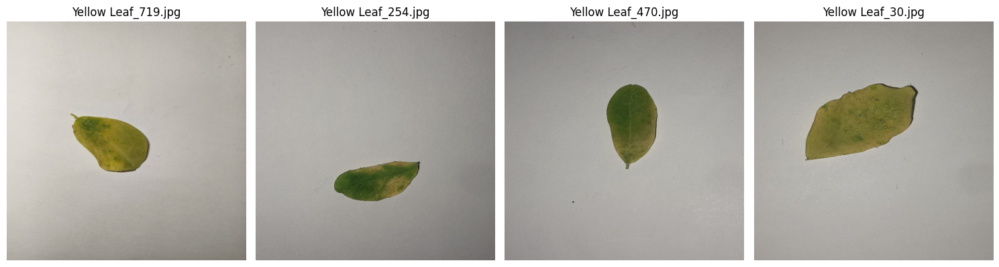


Images from 'Neem Yellow Leaf':


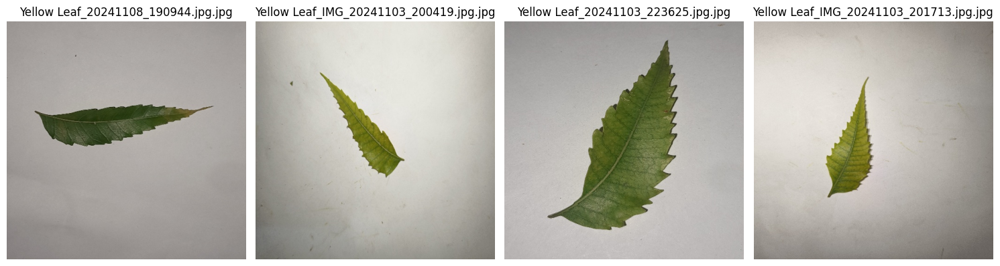


Images from 'Sojina Healthy Leaf':


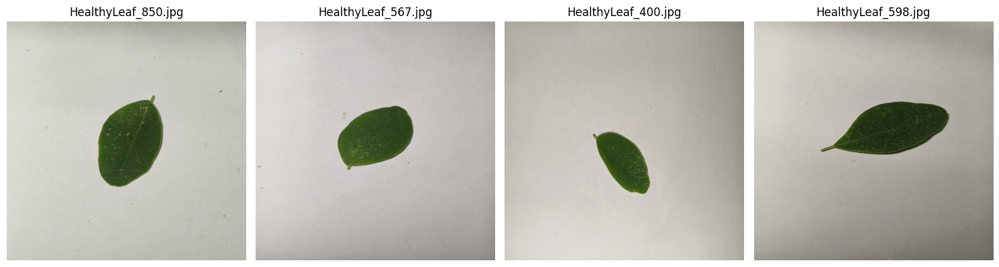


Images from 'Neem Shot Hole Leaf':


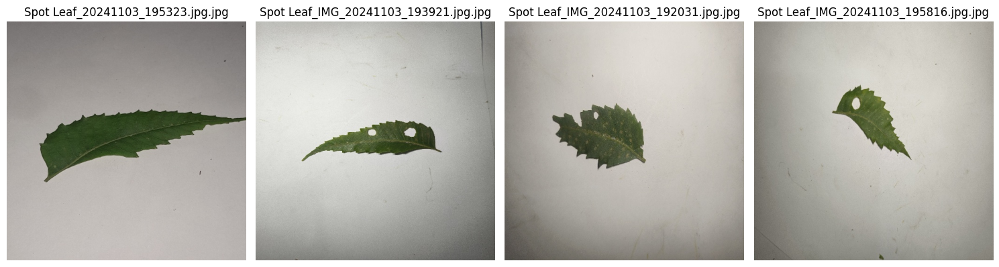


Images from 'HariTaki Healthy Leaf':


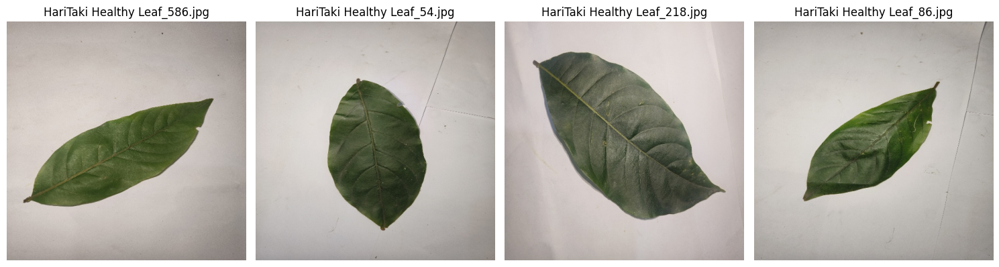


Images from 'Sojina Bacterial Spot':


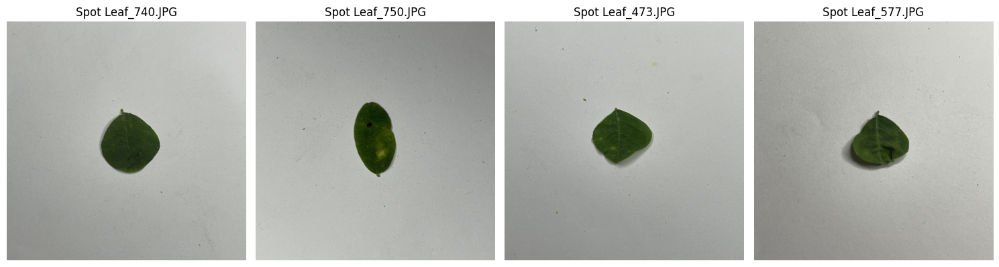


Images from 'HariTaki Shot Hole':


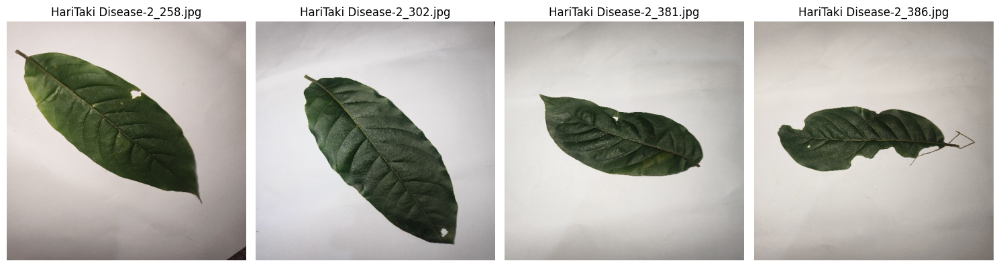


Images from 'Neem Powdery Mildew':


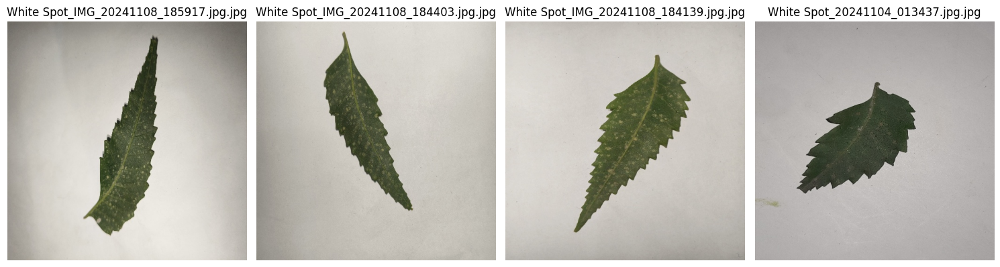


Images from 'Neem Healthy Leaf':


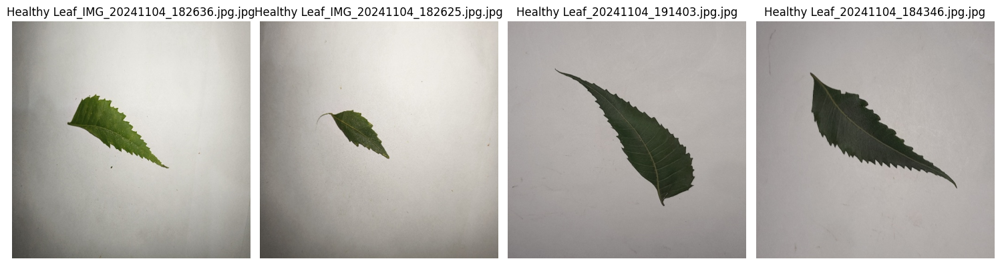


Images from 'HariTaki Bacterial Spot':


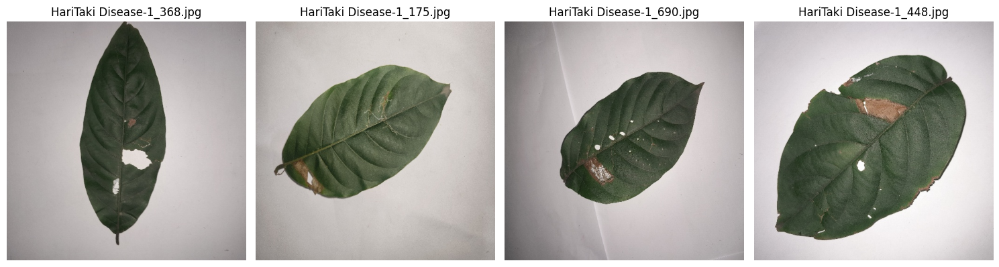


Images from 'Camphor Shot Hole':


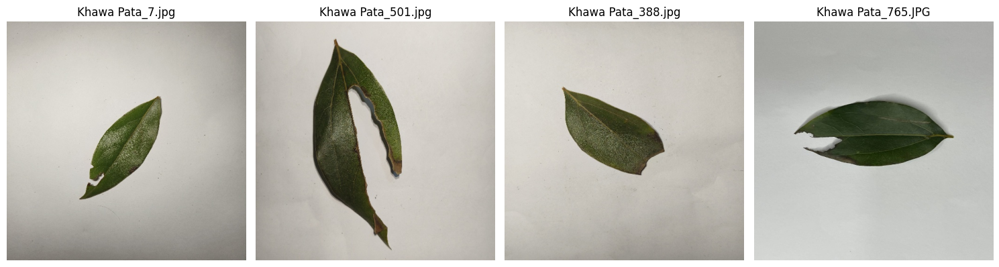


Images from 'Camphor Healthy Leaf':


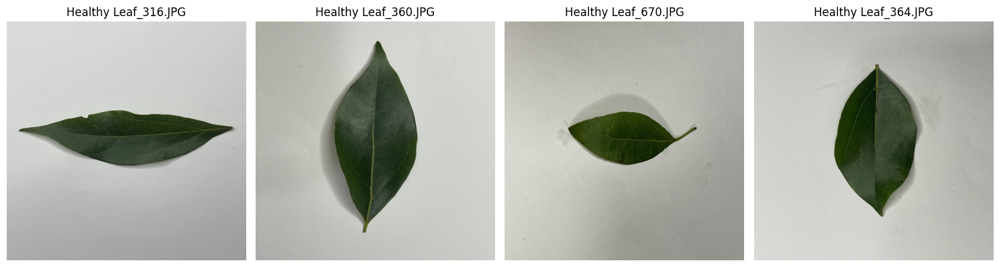


Images from 'Camphor Bacterial Spot':


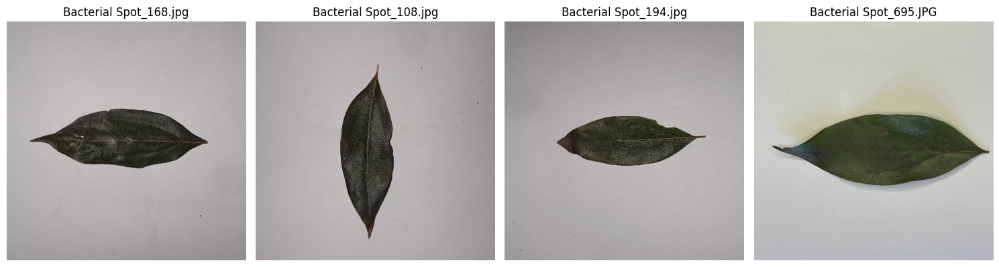

In [5]:
# Display 4 images from each subdirectory
print("\nDisplaying 4 images from each subdirectory:")
for directory in directories:
    subdirectory_path = os.path.join(BASE_DIR, directory)
    if os.path.isdir(subdirectory_path):
        print(f"\nImages from '{directory}':")
        files_in_subdir = os.listdir(subdirectory_path)
        image_files = [f for f in files_in_subdir if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))] # Filter for image files

        if image_files:
            # Select up to 4 random images
            selected_images = random.sample(image_files, min(len(image_files), 4))

            fig, axes = plt.subplots(1, len(selected_images), figsize=(15, 5))
            if len(selected_images) == 1: # Handle case with only one image
                axes = [axes]

            for i, image_file in enumerate(selected_images):
                image_path = os.path.join(subdirectory_path, image_file)
                try:
                    img = mpimg.imread(image_path)
                    axes[i].imshow(img)
                    axes[i].set_title(image_file)
                    axes[i].axis('off')
                except Exception as e:
                    print(f"Could not read image {image_file}: {e}")
                    axes[i].set_title("Error loading image")
                    axes[i].axis('off')

            plt.tight_layout()
            plt.show()
        else:
            print("No image files found in this directory to display.")

## Load and Preprocess the Data

In [6]:
dataset = tf.keras.utils.image_dataset_from_directory(
  BASE_DIR,
  image_size = (224, 224),
  batch_size = 32,
  shuffle = True,
  seed=123,
  label_mode = 'categorical'
)



Found 10858 files belonging to 13 classes.


In [7]:
# Define the split ratios
train_size = 0.8
val_size = 0.1
test_size = 0.1

dataset_size = tf.data.experimental.cardinality(dataset).numpy()
train_batches = int(train_size * dataset_size)
val_batches = int(val_size * dataset_size)
test_batches = dataset_size - train_batches - val_batches

# Split the dataset
train_dataset = dataset.take(train_batches)
val_dataset = dataset.skip(train_batches).take(val_batches)
test_dataset = dataset.skip(train_batches + val_batches)

print(f"Total batches: {dataset_size}")
print(f"Training batches: {tf.data.experimental.cardinality(train_dataset).numpy()}")
print(f"Validation batches: {tf.data.experimental.cardinality(val_dataset).numpy()}")
print(f"Test batches: {tf.data.experimental.cardinality(test_dataset).numpy()}")

Total batches: 340
Training batches: 272
Validation batches: 34
Test batches: 34


In [8]:
from tensorflow.keras.applications.resnet50 import preprocess_input

def preprocess(image, label):
    image = preprocess_input(image)
    return image, label

train_dataset = (
    train_dataset
    .map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    .cache()
    .prefetch(tf.data.AUTOTUNE)
)

val_dataset = (
    val_dataset
    .map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    .cache()
    .prefetch(tf.data.AUTOTUNE)
)

test_dataset = (
    test_dataset
    .map(preprocess, num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)


## Dedine the model

In [9]:
from tensorflow.keras.applications import ResNet50
import tensorflow as tf

IMG_SIZE = (224, 224, 3)
NUM_CLASSES = 13

inputs = tf.keras.Input(shape=IMG_SIZE)

base_model = ResNet50(
    include_top=False,
    weights='imagenet',
    input_shape=IMG_SIZE
)
base_model.trainable = False
x = base_model(inputs, training=False)

x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(256, activation='relu')(x)
x = tf.keras.layers.Dropout(0.5)(x)
outputs = tf.keras.layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 13)             │         3,341 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,115,597 (91.99 MB)

 Trainable params: 527,885 (2.01 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

## Training phase 1

In [10]:
# ==== Train pha 1 ====
history1 = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,
    verbose=1
)

Epoch 1/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 108s 336ms/step - accuracy: 0.4379 - loss: 1.7139 - val_accuracy: 0.8419 - val_loss: 0.5150
Epoch 2/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 66s 92ms/step - accuracy: 0.7778 - loss: 0.6307 - val_accuracy: 0.8842 - val_loss: 0.3674
Epoch 3/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - accuracy: 0.8360 - loss: 0.4659 - val_accuracy: 0.8980 - val_loss: 0.3086
Epoch 4/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - accuracy: 0.8724 - loss: 0.3863 - val_accuracy: 0.9099 - val_loss: 0.2697
Epoch 5/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - accuracy: 0.8769 - loss: 0.3490 - val_accuracy: 0.9145 - val_loss: 0.2545
Epoch 6/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - accuracy: 0.8937 - loss: 0.3058 - val_accuracy: 0.9228 - val_loss: 0.2299
Epoch 7/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 25s 92ms/step - accuracy: 0.9068 - loss: 0.2770 - val_accuracy: 0.9237 - val_loss: 0.2172
Epoch 8/10
272/272 ━━━━━━━━━━━━━━━━━━━━ 25s 91ms/step - accuracy: 0.9144 - loss: 0.2585 

## Training phase 2

In [11]:
base_model.trainable = True

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-6),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 13)             │         3,341 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,115,597 (91.99 MB)

 Trainable params: 24,062,477 (91.79 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [12]:
history2 = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=20,
    verbose=1
)

Epoch 1/20
272/272 ━━━━━━━━━━━━━━━━━━━━ 148s 313ms/step - accuracy: 0.6819 - loss: 1.0045 - val_accuracy: 0.8998 - val_loss: 0.2738
Epoch 2/20
272/272 ━━━━━━━━━━━━━━━━━━━━ 79s 292ms/step - accuracy: 0.9103 - loss: 0.2724 - val_accuracy: 0.9338 - val_loss: 0.1852
Epoch 3/20
272/272 ━━━━━━━━━━━━━━━━━━━━ 79s 291ms/step - accuracy: 0.9532 - loss: 0.1513 - val_accuracy: 0.9430 - val_loss: 0.1580
Epoch 4/20
272/272 ━━━━━━━━━━━━━━━━━━━━ 79s 292ms/step - accuracy: 0.9766 - loss: 0.0918 - val_accuracy: 0.9458 - val_loss: 0.1569
Epoch 5/20
272/272 ━━━━━━━━━━━━━━━━━━━━ 79s 291ms/step - accuracy: 0.9876 - loss: 0.0577 - val_accuracy: 0.9522 - val_loss: 0.1430
Epoch 6/20
272/272 ━━━━━━━━━━━━━━━━━━━━ 79s 291ms/step - accuracy: 0.9909 - loss: 0.0422 - val_accuracy: 0.9522 - val_loss: 0.1353
Epoch 7/20
272/272 ━━━━━━━━━━━━━━━━━━━━ 79s 291ms/step - accuracy: 0.9943 - loss: 0.0283 - val_accuracy: 0.9522 - val_loss: 0.1465
Epoch 8/20
272/272 ━━━━━━━━━━━━━━━━━━━━ 79s 291ms/step - accuracy: 0.9969 - loss: 

Plotting learning curve for Phase 1:


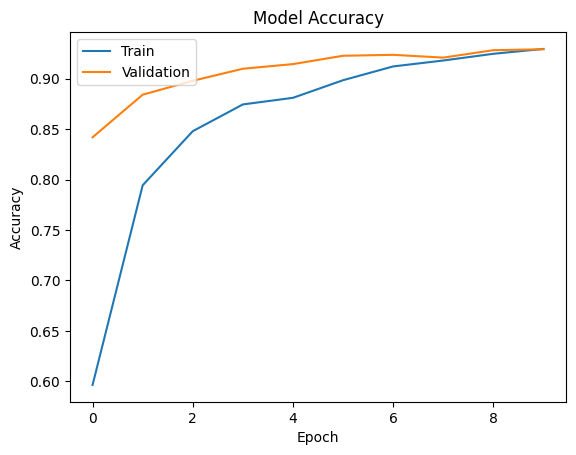

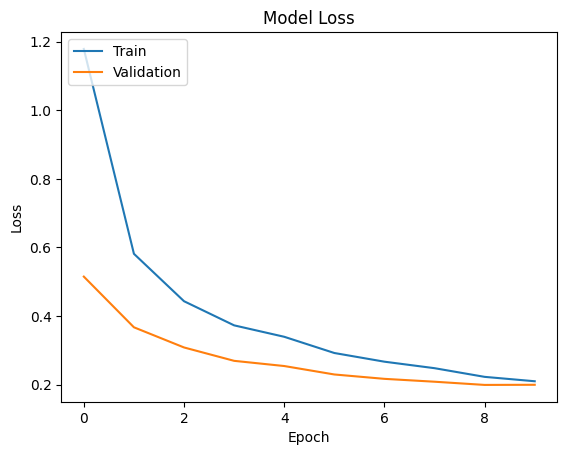


Plotting learning curve for Phase 2:


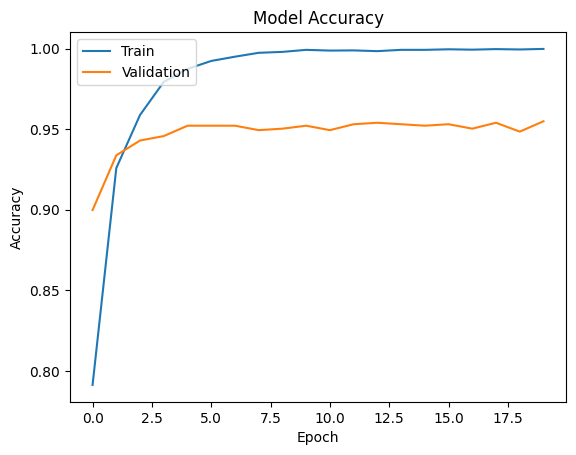

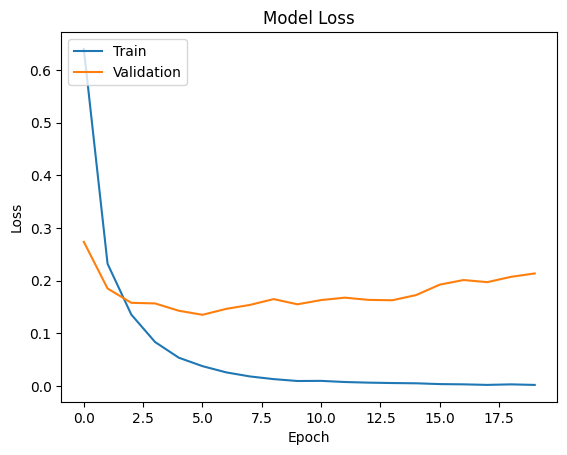

In [13]:
def plot_learning_curve(history, epochs):
    epoch_range = range(epochs)
    plt.plot(epoch_range, history.history['accuracy'])
    plt.plot(epoch_range, history.history['val_accuracy'])
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

    plt.plot(epoch_range, history.history['loss'])
    plt.plot(epoch_range, history.history['val_loss'])
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Validation'], loc='upper left')
    plt.show()

print("Plotting learning curve for Phase 1:")
plot_learning_curve(history1, epochs=10)

print("\nPlotting learning curve for Phase 2:")
plot_learning_curve(history2, epochs=20)

## Save model

In [14]:
model.save('/content/drive/MyDrive/CV Project/Train2/model.h5')
print("Model saved as model.h5")

Model saved as model.h5


## Load model

In [15]:
# Load the saved model
model = tf.keras.models.load_model('/content/drive/MyDrive/CV Project/Train2/model.h5')
model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 13)             │         3,341 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,115,599 (91.99 MB)

 Trainable params: 24,062,477 (91.79 MB)

 Non-trainable params: 53,120 (207.50 KB)

 Optimizer params: 2 (12.00 B)

## Evaluation

In [16]:
# Evaluate the loaded model on the test dataset
loss, accuracy = model.evaluate(test_dataset, verbose=1)

print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

34/34 ━━━━━━━━━━━━━━━━━━━━ 274s 6s/step - accuracy: 0.9525 - loss: 0.2015
Test Loss: 0.21301592886447906
Test Accuracy: 0.9502814412117004


## Confusion matrix

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 222ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 255ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 193ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 276ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 237ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

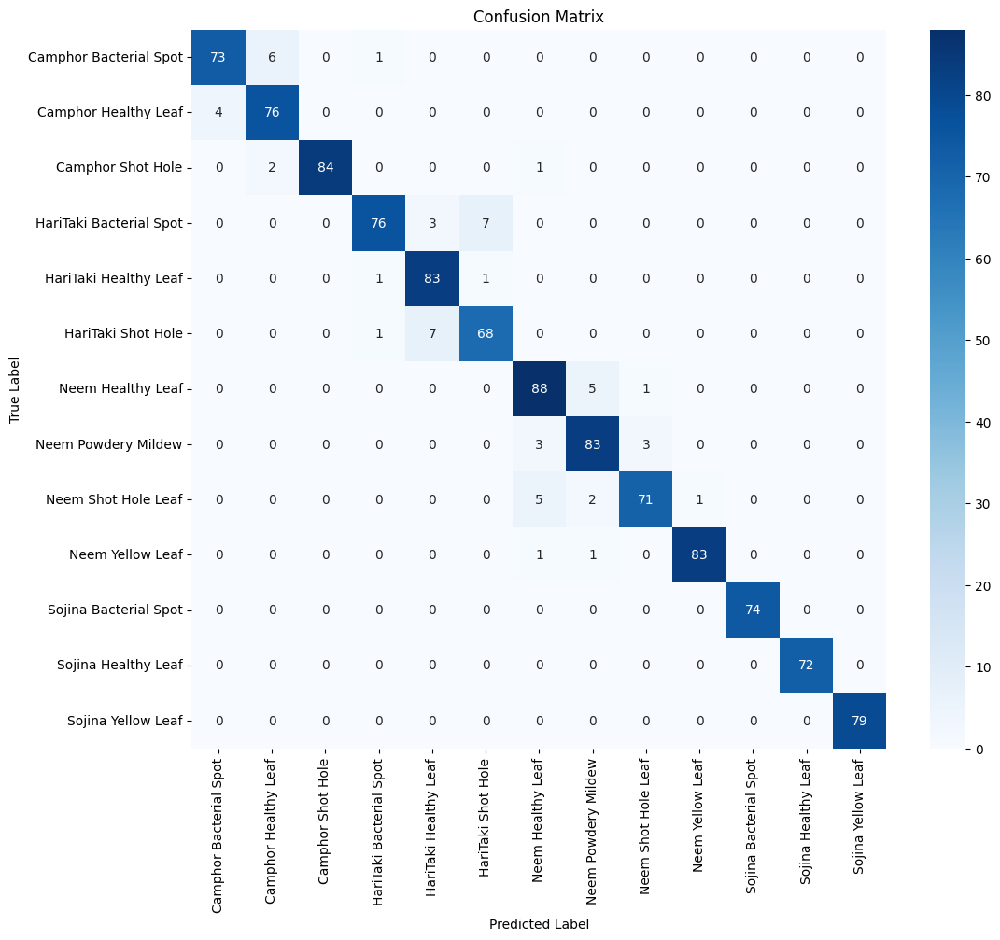

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Get the true labels and predictions for the test dataset
y_true = []
y_pred = []

for images, labels in test_dataset:
    y_true.extend(tf.argmax(labels, axis=1).numpy())
    y_pred.extend(tf.argmax(model.predict(images), axis=1).numpy())

# Calculate the confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Get the class names from the dataset
class_names = dataset.class_names

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

## T-SNE

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

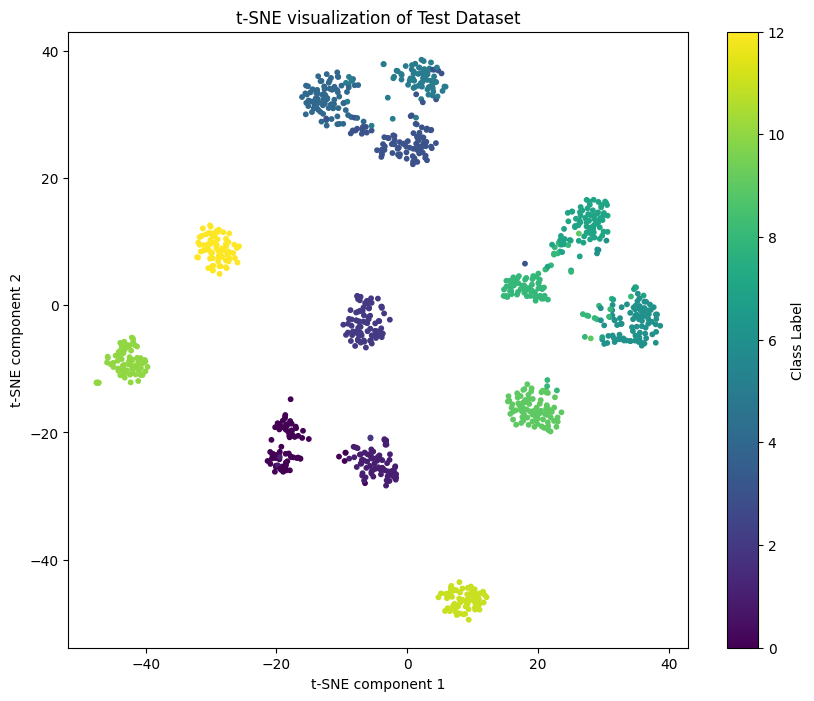

In [18]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Extract features from the test dataset using the trained model
feature_extractor = tf.keras.models.Model(inputs=model.inputs, outputs=model.layers[-3].output) # Get output before the dense layers
features = []
labels = []
for images, batch_labels in test_dataset:
    batch_features = feature_extractor.predict(images)
    features.append(batch_features)
    labels.append(tf.argmax(batch_labels, axis=1).numpy())

features = np.concatenate(features, axis=0)
labels = np.concatenate(labels, axis=0)

# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2, random_state=42, init='pca')
tsne_features = tsne.fit_transform(features)

# Plot the t-SNE space
plt.figure(figsize=(10, 8))
scatter = plt.scatter(tsne_features[:, 0], tsne_features[:, 1], c=labels, cmap='viridis', s=10)
plt.title('t-SNE visualization of Test Dataset')
plt.xlabel('t-SNE component 1')
plt.ylabel('t-SNE component 2')
plt.colorbar(scatter, label='Class Label')
plt.show()

In [28]:
# Chuyển đổi toàn bộ test_dataset thành các mảng NumPy để dễ dàng truy cập
print("Đang chuyển đổi test_dataset sang NumPy... Vui lòng đợi.")
X_test_np = []
y_test_np = []

for image_batch, label_batch in test_dataset:
    X_test_np.append(image_batch.numpy())
    y_test_np.append(label_batch.numpy())

# Nối tất cả các batch lại thành một mảng lớn duy nhất
X_test_np = np.concatenate(X_test_np, axis=0)
y_test_np = np.concatenate(y_test_np, axis=0)

print(f"Chuyển đổi hoàn tất!")
print(f"Shape của X_test_np (toàn bộ ảnh test): {X_test_np.shape}")
print(f"Shape của y_test_np (toàn bộ nhãn test): {y_test_np.shape}")

Đang chuyển đổi test_dataset sang NumPy... Vui lòng đợi.
Chuyển đổi hoàn tất!
Shape của X_test_np (toàn bộ ảnh test): (1066, 224, 224, 3)
Shape của y_test_np (toàn bộ nhãn test): (1066, 13)


Đã lấy thành công danh sách tên các lớp:
['Camphor Bacterial Spot', 'Camphor Healthy Leaf', 'Camphor Shot Hole', 'HariTaki Bacterial Spot', 'HariTaki Healthy Leaf', 'HariTaki Shot Hole', 'Neem Healthy Leaf', 'Neem Powdery Mildew', 'Neem Shot Hole Leaf', 'Neem Yellow Leaf', 'Sojina Bacterial Spot', 'Sojina Healthy Leaf', 'Sojina Yellow Leaf']


/tmp/ipython-input-562709758.py:63: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("jet")


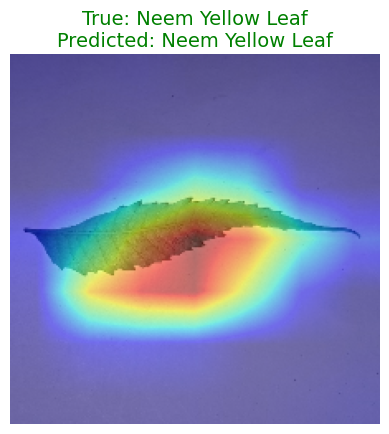

In [32]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

try:
    class_names = dataset.class_names
    print("Đã lấy thành công danh sách tên các lớp:")
    print(class_names)
except NameError:
    print("Biến 'dataset' không tồn tại. Vui lòng tạo lại dataset gốc để lấy class_names.")
    class_names = [f'Lớp {i}' for i in range(NUM_CLASSES)]

def grad_cam_final(model, img, true_label=None, last_conv_layer_name="conv5_block3_out"):
    base_model = model.get_layer('resnet50')
    classifier_layers = [
        model.get_layer('global_average_pooling2d'),
        model.get_layer('dense'),
        model.get_layer('dropout'),
        model.get_layer('dense_1')
    ]
    with tf.GradientTape() as tape:
        conv_out = base_model(img)
        tape.watch(conv_out)
        x = conv_out
        for layer in classifier_layers:
            x = layer(x)
        preds = x
        class_idx = tf.argmax(preds[0])
        if true_label is not None:
            class_idx = tf.constant(true_label)
        loss = preds[:, class_idx]
    grads = tape.gradient(loss, conv_out)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_out_for_heatmap = conv_out[0]
    heatmap = tf.reduce_sum(tf.multiply(conv_out_for_heatmap, pooled_grads), axis=-1)
    heatmap = tf.maximum(heatmap, 0) / (tf.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy(), int(class_idx)


def show_gradcam_with_labels(model, img_array_3d, true_label_index, class_names, alpha=0.5):
    """
    Hàm "tất cả trong một": chạy Grad-CAM và hiển thị kết quả với nhãn đầy đủ.
    """
    # 1. Chuẩn bị ảnh để đưa vào model (thêm chiều batch)
    img_tensor_4d = tf.expand_dims(img_array_3d, axis=0)

    # 2. Chạy Grad-CAM để lấy heatmap và dự đoán
    heatmap, predicted_class_index = grad_cam_final(model, img_tensor_4d)

    # 3. Tra lookup tên lớp từ chỉ số
    true_label_name = class_names[true_label_index]
    predicted_label_name = class_names[predicted_class_index]

    # 4. Tạo tiêu đề và xác định màu sắc
    title_text = f"True: {true_label_name}\nPredicted: {predicted_label_name}"
    title_color = 'green' if true_label_index == predicted_class_index else 'red'

    # 5. Logic hiển thị (từ hàm display_gradcam_final)
    img_array_norm = (img_array_3d - np.min(img_array_3d)) / (np.max(img_array_3d) - np.min(img_array_3d))
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], [img_array_3d.shape[0], img_array_3d.shape[1]])
    heatmap_resized = tf.squeeze(heatmap_resized)
    cmap = cm.get_cmap("jet")
    heatmap_colored = cmap(heatmap_resized)[..., :3]
    superimposed_img = heatmap_colored * alpha + img_array_norm * (1 - alpha)
    superimposed_img = np.clip(superimposed_img, 0, 1)

    # 6. Vẽ biểu đồ với tiêu đề đã có nhãn
    plt.imshow(superimposed_img)
    plt.title(title_text, color=title_color, fontsize=14)
    plt.axis('off')
    plt.show()

image_index = 64 # <-- BẠN CÓ THỂ THAY ĐỔI SỐ NÀY

image_to_show = X_test_np[image_index]
true_label_index = np.argmax(y_test_np[image_index])

show_gradcam_with_labels(model, image_to_show, true_label_index, class_names)

Bắt đầu tạo Grad-CAM cho tất cả các lớp...
-> Đang xử lý lớp: Camphor Bacterial Spot


/tmp/ipython-input-2796251306.py:25: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("jet")


-> Đang xử lý lớp: Camphor Healthy Leaf
-> Đang xử lý lớp: Camphor Shot Hole
-> Đang xử lý lớp: HariTaki Bacterial Spot
-> Đang xử lý lớp: HariTaki Healthy Leaf
-> Đang xử lý lớp: HariTaki Shot Hole
-> Đang xử lý lớp: Neem Healthy Leaf
-> Đang xử lý lớp: Neem Powdery Mildew
-> Đang xử lý lớp: Neem Shot Hole Leaf
-> Đang xử lý lớp: Neem Yellow Leaf
-> Đang xử lý lớp: Sojina Bacterial Spot
-> Đang xử lý lớp: Sojina Healthy Leaf
-> Đang xử lý lớp: Sojina Yellow Leaf


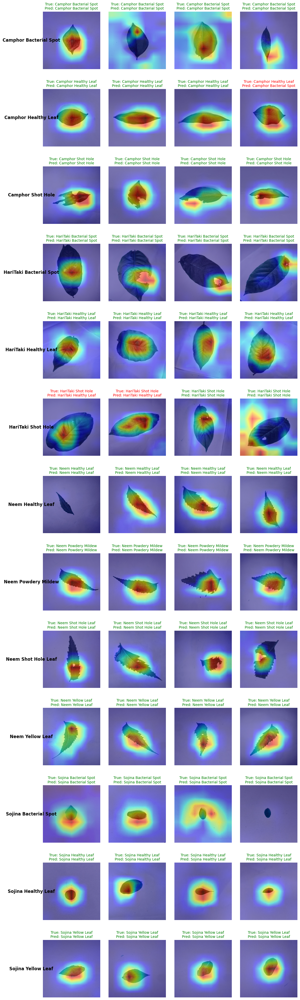

Hoàn tất!


In [35]:
y_test_labels_int = np.argmax(y_test_np, axis=1)

def plot_gradcam_on_ax(ax, model, img_array_3d, true_label_index, class_names, alpha=0.5):
    """
    Hàm này chạy Grad-CAM và vẽ kết quả lên một đối tượng `ax` (subplot) được cung cấp.
    """
    # 1. Chuẩn bị ảnh
    img_tensor_4d = tf.expand_dims(img_array_3d, axis=0)

    # 2. Chạy Grad-CAM
    heatmap, predicted_class_index = grad_cam_final(model, img_tensor_4d)

    # 3. Tra cứu tên lớp
    true_label_name = class_names[true_label_index]
    predicted_label_name = class_names[predicted_class_index]

    # 4. Tạo tiêu đề và màu sắc
    title_text = f"True: {true_label_name.split('___')[0]}\nPred: {predicted_label_name.split('___')[0]}"
    title_color = 'green' if true_label_index == predicted_class_index else 'red'

    # 5. Logic hiển thị
    img_array_norm = (img_array_3d - np.min(img_array_3d)) / (np.max(img_array_3d) - np.min(img_array_3d))
    heatmap_resized = tf.image.resize(heatmap[..., np.newaxis], [img_array_3d.shape[0], img_array_3d.shape[1]])
    heatmap_resized = tf.squeeze(heatmap_resized)
    cmap = cm.get_cmap("jet")
    heatmap_colored = cmap(heatmap_resized)[..., :3]
    superimposed_img = heatmap_colored * alpha + img_array_norm * (1 - alpha)
    superimposed_img = np.clip(superimposed_img, 0, 1)

    # 6. Vẽ lên subplot (ax) thay vì plt
    ax.imshow(superimposed_img)
    ax.set_title(title_text, color=title_color, fontsize=10)
    ax.axis('off')

# -- PHẦN THỰC THI CHÍNH --
num_classes = 13
samples_per_class = 4

fig, axes = plt.subplots(num_classes, samples_per_class, figsize=(12, 3 * num_classes))

print("Bắt đầu tạo Grad-CAM cho tất cả các lớp...")

for class_idx in range(num_classes):
    class_name = class_names[class_idx]
    print(f"-> Đang xử lý lớp: {class_name}")

    indices_of_class = np.where(y_test_labels_int == class_idx)[0]

    if len(indices_of_class) == 0:
        print(f"   (Cảnh báo) Không có mẫu nào cho lớp '{class_name}' trong tập test.")

        for i in range(samples_per_class):
            axes[class_idx, i].axis('off')
        continue

    num_to_sample = min(len(indices_of_class), samples_per_class)
    selected_indices = np.random.choice(indices_of_class, size=num_to_sample, replace=False)

    for i, image_index in enumerate(selected_indices):
        ax = axes[class_idx, i]
        image_to_show = X_test_np[image_index]
        true_label_index = y_test_labels_int[image_index]
        plot_gradcam_on_ax(ax, model, image_to_show, true_label_index, class_names)
        if i == 0:
            ax.text(-0.2, 0.5, class_name.replace('___', '\n'),
                    ha='center', va='center', transform=ax.transAxes, fontsize=12, weight='bold')


plt.tight_layout(pad=2.0, h_pad=3.0)
plt.show()

print("Hoàn tất!")

# Nhận xét Tổng quan
- Nhìn chung, mô hình của bạn hoạt động cực kỳ hiệu quả và hợp lý. Nó không phải là một "hộp đen" đoán mò, mà đã thực sự học được cách tập trung vào các đặc điểm hình ảnh quan trọng để phân loại. Có hai "chiến lược" chính mà mô hình đã học được:

- - Chiến lược "Định vị" (Localization): Đối với các lớp bệnh có triệu chứng rõ ràng (như lỗ thủng, đốm), mô hình tập trung chính xác vào các vùng đó.

- - Chiến lược "Toàn thể" (Holistic): Đối với các lớp chỉ trạng thái chung (như lá khỏe mạnh, lá vàng), mô hình tập trung vào toàn bộ thân lá để đánh giá hình dạng, màu sắc và kết cấu tổng thể.

- Đây là dấu hiệu của một mô hình được huấn luyện rất tốt.

# Phân tích Chi tiết - Các Điểm Tích cực Nổi bật
1. Khả năng "Định vị" Bệnh rất Tốt
- Đây là điểm ấn tượng nhất. Trong nhiều trường hợp, mô hình hoạt động như một chuyên gia thực thụ.

- - Camphor Shot Hole: Ở mẫu đầu tiên và thứ ba, vùng heatmap màu đỏ/vàng tập trung chính xác vào các lỗ thủng trên lá. Điều này cực kỳ thuyết phục, cho thấy mô hình biết rằng "lỗ thủng" là đặc điểm nhận dạng chính của lớp này.

- - HariTaki Bacterial Spot: Vùng nóng tập trung rõ ràng vào các đốm bệnh trên bề mặt lá. Mô hình không bị phân tâm bởi hình dạng hay màu sắc chung mà đi thẳng vào dấu hiệu của bệnh.

- - Sujina Bacterial Spot: Tương tự, mô hình tập trung vào thân lá, nơi các đốm vi khuẩn thường xuất hiện.

=> Ý nghĩa: Điều này làm tăng đáng kể độ tin cậy của mô hình. Khi nó dự đoán một loại bệnh, bạn có thể tin rằng nó đã "nhìn thấy" triệu chứng của bệnh đó.

2. Nhận dạng Lá Khỏe mạnh một cách Hợp lý
- Đối với các lớp lá khỏe mạnh (Camphor Healthy Leaf, HariTaki Healthy Leaf, Neem Healthy Leaf, Sujina Healthy Leaf), mô hình nhất quán tập trung vào phần thân chính và hình dạng tổng thể của lá. Đây là một chiến lược hoàn toàn hợp lý, vì để xác định một chiếc lá là "khỏe mạnh" thuộc loại nào, các đặc điểm nhận dạng chính là hình dạng và kết cấu chung.

# Phân tích Chi tiết - Các Trường hợp Thú vị và Cần Chú ý
- Đây là những điểm mà X-AI thực sự tỏa sáng, giúp bạn hiểu sâu hơn về giới hạn và hành vi của mô hình.

1. Trường hợp Dự đoán Sai (HariTaki Shot Hole)
- Ở hàng "HariTaki Shot Hole", mẫu thứ ba có tiêu đề màu đỏ, cho thấy dự đoán sai: Nhãn thật là "Shot Hole" nhưng mô hình dự đoán là "Healthy Leaf".

- Tại sao? Nhìn vào heatmap, mô hình tập trung vào phần thân lá có màu xanh và trông khá khỏe mạnh. Rất có thể trong trường hợp này, các lỗ thủng quá nhỏ hoặc không rõ ràng, nên mô hình đã ưu tiên các đặc điểm "khỏe mạnh" tổng thể (màu sắc, bề mặt) và bỏ qua dấu hiệu bệnh.

=> Ý nghĩa: Đây là một ví dụ kinh điển về sự nhầm lẫn giữa các lớp. Nó cho bạn biết chính xác loại ảnh nào có thể khiến mô hình của bạn bối rối, giúp bạn tìm thêm dữ liệu tương tự để huấn luyện lại và cải thiện.

2. Ảnh hưởng của Chất lượng Ảnh (Ảnh Tối, Độ tương phản thấp)
- Hãy chú ý đến các ảnh ở cột ngoài cùng bên phải của các lớp Camphor Healthy Leaf và Camphor Shot Hole. Các ảnh này tối hơn và có độ tương phản thấp hơn nhiều.

- Kết quả: Heatmap trên những ảnh này rất yếu hoặc gần như không có. Điều này không có nghĩa là code sai. Nó có nghĩa là đối với những ảnh chất lượng kém này, mô hình không thể tìm thấy một vùng nào đủ nổi bật và chắc chắn để tập trung vào. Mặc dù dự đoán cuối cùng vẫn đúng, nhưng "sự tự tin" vào bằng chứng hình ảnh của nó rất thấp.

=> Ý nghĩa: Đây là một phát hiện quan trọng. Nó cho thấy mô hình của bạn có thể nhạy cảm với điều kiện ánh sáng và chất lượng ảnh.

# Đề xuất và Hướng đi Tiếp theo
- Cải thiện dữ liệu: Dựa vào trường hợp dự đoán sai, hãy tìm thêm các ảnh "khó" (ví dụ: lá bị bệnh nhưng triệu chứng rất mờ nhạt) để bổ sung vào tập huấn luyện.

- Tăng cường Dữ liệu (Data Augmentation): Dựa vào vấn đề với ảnh tối, hãy áp dụng các kỹ thuật tăng cường dữ liệu làm thay đổi độ sáng và độ tương phản (tf.image.random_brightness, tf.image.random_contrast) trong pipeline huấn luyện. Điều này sẽ giúp mô hình trở nên mạnh mẽ và ít bị ảnh hưởng bởi chất lượng ảnh hơn.

Kết luận: Phân tích Grad-CAM này đã thành công rực rỡ. Nó không chỉ xác nhận rằng mô hình của bạn hoạt động rất tốt trong hầu hết các trường hợp, mà còn chỉ ra chính xác những điểm yếu và các trường hợp cụ thể mà mô hình có thể gặp khó khăn, từ đó cung cấp cho bạn hướng đi rõ ràng để cải thiện nó hơn nữa.